## Name: Mohamed Ayman Mohamed 
## ID : 900182267 

### This is the new version of the spotify case study with EDA. In this notebook, I would use a new dataset to be able to answer more various questions.

### In this notebook, I will try to answer the following
#### 1. Is the number of tracks surging drastically overtime? 
#### 2. Does the time duration of songs decrease by time passing? 
#### 3. Does songs have more liveness rate with respect to the timeline? 
#### 4. Is more sad songs released by time passing? 
#### 5. Is songs more popular with an increase in the rate of danceability?  
#### 6. Is there a directed relationship between danceability, Energy, and instrumentalness?


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df_by_track = pd.read_csv('./tracks.csv')

## 1. Understanding The data

In [ ]:
df_by_track.shape

(586672, 20)

In [ ]:
df_by_track.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586672 non-null  int64  
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-null  object 
 6   id_artists        586672 non-null  object 
 7   release_date      586672 non-null  object 
 8   danceability      586672 non-null  float64
 9   energy            586672 non-null  float64
 10  key               586672 non-null  int64  
 11  loudness          586672 non-null  float64
 12  mode              586672 non-null  int64  
 13  speechiness       586672 non-null  float64
 14  acousticness      586672 non-null  float64
 15  instrumentalness  586672 non-null  float64
 16  liveness          58

### 1.1 The meanings of each feature:  (Taken from link [1])
1. artists: The list of artists of the song.

2. danceability: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

3. duration_ms: The duration of the track in milliseconds.

4. energy: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy. (Float)

5. explicit: The content item is explicit and the user’s account is set to not play explicit content. Additional reasons may be added in the future. Note: If you use this field, make sure that your application safely handles unknown values.

7. instrumentalness: Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

8. key: The key the track is in. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.

9. liveness: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

10. loudness: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.

11. mode: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

12. name: Name of the song.

13. popularity: The popularity of the track. The value will be between 0 and 100, with 100 being the most popular. The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are. Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently. Artist and album popularity is derived mathematically from track popularity. Note that the popularity value may lag actual popularity by a few days: the value is not updated in real time.

14. release_date: The date the album was first released, for example “1981-12-15”. Depending on the precision, it might be shown as “1981” or “1981-12”.

15. speechiness: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.

16. tempo: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.

17. valence: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

18. year: Year information extracted from release_date.

19. genres: A list of the genres used to classify the album. For example: “Prog Rock” , “Post-Grunge”. (If not yet classified, the array is empty.)

### 1.2 Checking whether the data is corrupted or not 

In [ ]:
df_by_track.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [ ]:
df_by_track.tail()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
586667,5rgu12WBIHQtvej2MdHSH0,云与海,50,258267,0,['阿YueYue'],['1QLBXKM5GCpyQQSVMNZqrZ'],2020-09-26,0.560,0.518,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4
586668,0NuWgxEp51CutD2pJoF4OM,blind,72,153293,0,['ROLE MODEL'],['1dy5WNgIKQU6ezkpZs4y8z'],2020-10-21,0.765,0.663,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4
586669,27Y1N4Q4U3EfDU5Ubw8ws2,What They'll Say About Us,70,187601,0,['FINNEAS'],['37M5pPGs6V1fchFJSgCguX'],2020-09-02,0.535,0.314,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4
586670,45XJsGpFTyzbzeWK8VzR8S,A Day At A Time,58,142003,0,"['Gentle Bones', 'Clara Benin']","['4jGPdu95icCKVF31CcFKbS', '5ebPSE9YI5aLeZ1Z2g...",2021-03-05,0.696,0.615,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4
586671,5Ocn6dZ3BJFPWh4ylwFXtn,Mar de Emociones,38,214360,0,['Afrosound'],['0i4Qda0k4nf7jnNHmSNpYv'],2015-07-01,0.686,0.723,6,-7.067,1,0.0363,0.105,0.000000,0.2640,0.9750,112.204,4


### 1.3 Checking whether the data has missing values 

In [ ]:
df_by_track.isnull().sum() 

id                   0
name                71
popularity           0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

In [ ]:
df_by_track.apply(lambda x: len(x.unique()), axis = 0) #Check the uniquness of each feature 

id                  586672
name                446475
popularity             101
duration_ms         123122
explicit                 2
artists             114030
id_artists          115062
release_date         19700
danceability          1285
energy                2571
key                     12
loudness             29196
mode                     2
speechiness           1655
acousticness          5217
instrumentalness      5402
liveness              1782
valence               1805
tempo               122706
time_signature           5
dtype: int64

In [ ]:
bool_series = df_by_track.duplicated()  #Check Duplicates

In [ ]:
bool_series.sum() # we do not have duplicates

0

In [ ]:
df_by_track.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,586672.0,27.570053,18.370642,0.0,13.0000,27.000000,41.00000,100.000
duration_ms,586672.0,230051.167286,126526.087418,3344.0,175093.0000,214893.000000,263867.00000,5621218.000
explicit,586672.0,0.044086,0.205286,0.0,0.0000,0.000000,0.00000,1.000
danceability,586672.0,0.563594,0.166103,0.0,0.4530,0.577000,0.68600,0.991
energy,586672.0,0.542036,0.251923,0.0,0.3430,0.549000,0.74800,1.000
key,586672.0,5.221603,3.519423,0.0,2.0000,5.000000,8.00000,11.000
loudness,586672.0,-10.206067,5.089328,-60.0,-12.8910,-9.243000,-6.48200,5.376
mode,586672.0,0.658797,0.474114,0.0,0.0000,1.000000,1.00000,1.000
speechiness,586672.0,0.104864,0.179893,0.0,0.0340,0.044300,0.07630,0.971
acousticness,586672.0,0.449863,0.348837,0.0,0.0969,0.422000,0.78500,0.996


### Conclusion to section 1: 
#### It is clear to notice that dataset does not have any duplicates. However, there is a problem of missing values in the feature name. As mentioned before, dealing with proper names (converting to meaningful, numerical representation is quite difficult). For simplicity, it will be dropped. Second, we need to convert any categorical data to one hot encoding. The categorical data are [ mode, key, time_signature, explicit]. I will need to do this before data visualization. 
#### artist_name feature is quite problematic, as it includes important value for the data, as the popularity has a great effect from the artist names, theoratically- I need to prove it later :). We have two options to convert this feature string to numerical representations. Text Embedding is the best option to be able to take semantics into consideration with taking huge size from the storage. Another option is using one Hot Encoding [114030 new features]. However, we will need to have a powerful PC to pre-process such a thing. We cannot represent it as unique IDs, as unique IDs will noise the data more (we need to have it in higher dimensions). For sake of simplicity, I will drop it.

#### 3.artist_id is not necessery at all for the data
#### 4. Regarding time Release feature, we just need the years
#### 5. Converting duration unit to be in minutes.
#### 6. Transforming the loudness to be the minimum 0 instead of negative number

In [ ]:
df = df_by_track.copy()

## 2. Preparing the data for just data Visualization

### 2.1 Deleting the name, id, id_artists, and artists Features

In [ ]:
df.drop('name', inplace=True, axis=1)
df.drop('id', inplace=True, axis=1)
df.drop('artists', inplace=True, axis=1)
df.drop('id_artists', inplace=True, axis=1)



In [ ]:
df['year']=df['release_date'].str[0:4]

In [ ]:
df.drop('release_date', inplace=True, axis=1)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   popularity        586672 non-null  int64  
 1   duration_ms       586672 non-null  int64  
 2   explicit          586672 non-null  int64  
 3   danceability      586672 non-null  float64
 4   energy            586672 non-null  float64
 5   key               586672 non-null  int64  
 6   loudness          586672 non-null  float64
 7   mode              586672 non-null  int64  
 8   speechiness       586672 non-null  float64
 9   acousticness      586672 non-null  float64
 10  instrumentalness  586672 non-null  float64
 11  liveness          586672 non-null  float64
 12  valence           586672 non-null  float64
 13  tempo             586672 non-null  float64
 14  time_signature    586672 non-null  int64  
 15  year              586672 non-null  object 
dtypes: float64(9), int64

In [ ]:
df.isnull().sum()

popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
year                0
dtype: int64

## 3. Data Visualization

### 3.1 Visualizing the distribution of key and mode in the data

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objs as pgo #Interactive Plots

fig = make_subplots(rows=1, cols=3,specs=[[{"type": "pie"}, {"type": "pie"},{"type": "pie"}]])
key_mapping = {0:"C",1:"C♯",2:"D",3:"D♯",4:"E",5:"F",6:"F♯",7:"G",8:"G♯",9:"A",10:"A♯",11:"B"} #from the data
mode_mapping = {0:"Minor",1:"Major"} # from the data
signature_mapping = {1 : "1", 2 : "2" ,3: "3", 4: "4", 5: "5"}

In [ ]:
def getDataAndLabel(feature):
    featureValues = pd.DataFrame(df[feature].value_counts())
    if feature == 'key':
        mapper = key_mapping 
    elif feature == 'mode' : 
        mapper = mode_mapping
    else: 
        mapper = signature_mapping
    featureValues['index'] = featureValues.index.to_series().map(mapper)
    return featureValues

In [ ]:
keyValues = getDataAndLabel('key')
modeValues = getDataAndLabel('mode')
timeSignature = getDataAndLabel('time_signature')

In [ ]:
fig.add_trace(
    pgo.Pie(labels=keyValues['index'], values=keyValues['key']),row=1, col=1)

fig.add_trace(
    pgo.Pie(labels=modeValues['index'], values=modeValues['mode']),row=1, col=2)

fig.add_trace(
    pgo.Pie(labels=timeSignature['index'], values=timeSignature['time_signature']),row=1, col=3)

fig.update_traces(textposition='inside', textinfo='percent+label')


fig.update_layout(height=600, width=1200, title_text="Keys and Modes")
fig.show()


### 3.2 Visualize each Feature using skewness and Kurtosis:
https://www.itl.nist.gov/div898/handbook/eda/section3/eda35b.htm#:~:text=Skewness%20is%20a%20measure%20of,relative%20to%20a%20normal%20distribution.

### Skewness is a measure of symmetry, or more precisely, the lack of symmetry. A distribution, or data set, is symmetric if it looks the same to the left and right of the center point.
![download.png](attachment:download.png)

### Kurtosis is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution (4th moment in the moment-based calculation). That is, data sets with high kurtosis tend to have heavy tails, or outliers. Data sets with low kurtosis tend to have light tails, or lack of outliers. A uniform distribution would be the extreme case.
![800px-Standard_symmetric_pdfs.svg.png](attachment:800px-Standard_symmetric_pdfs.svg.png)

In [ ]:
from scipy.stats import skew

In [ ]:
df.skew()

popularity           0.278697
duration_ms         10.325622
explicit             4.441754
danceability        -0.330825
energy              -0.131383
key                 -0.001394
loudness            -1.235983
mode                -0.669873
speechiness          3.693951
acousticness         0.151161
instrumentalness     2.270398
liveness             2.044802
valence             -0.152306
tempo                0.403266
time_signature      -3.248981
year                -0.668279
dtype: float64

In [ ]:
df.kurt()

popularity           -0.632802
duration_ms         241.066552
explicit             17.729238
danceability         -0.274021
energy               -0.963792
key                  -1.265939
loudness              2.717572
mode                 -1.551276
speechiness          13.417449
acousticness         -1.466174
instrumentalness      3.547210
liveness              4.288781
valence              -1.037216
tempo                -0.063967
time_signature       16.794440
year                 -0.224213
dtype: float64

0   0


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



0   1


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



0   2


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



0   3


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



1   0


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



1   1


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



1   2


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



1   3


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



2   0


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



2   1


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



2   2


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



2   3


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



3   0


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



3   1


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



3   2


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



3   3


/home/ayman/.local/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



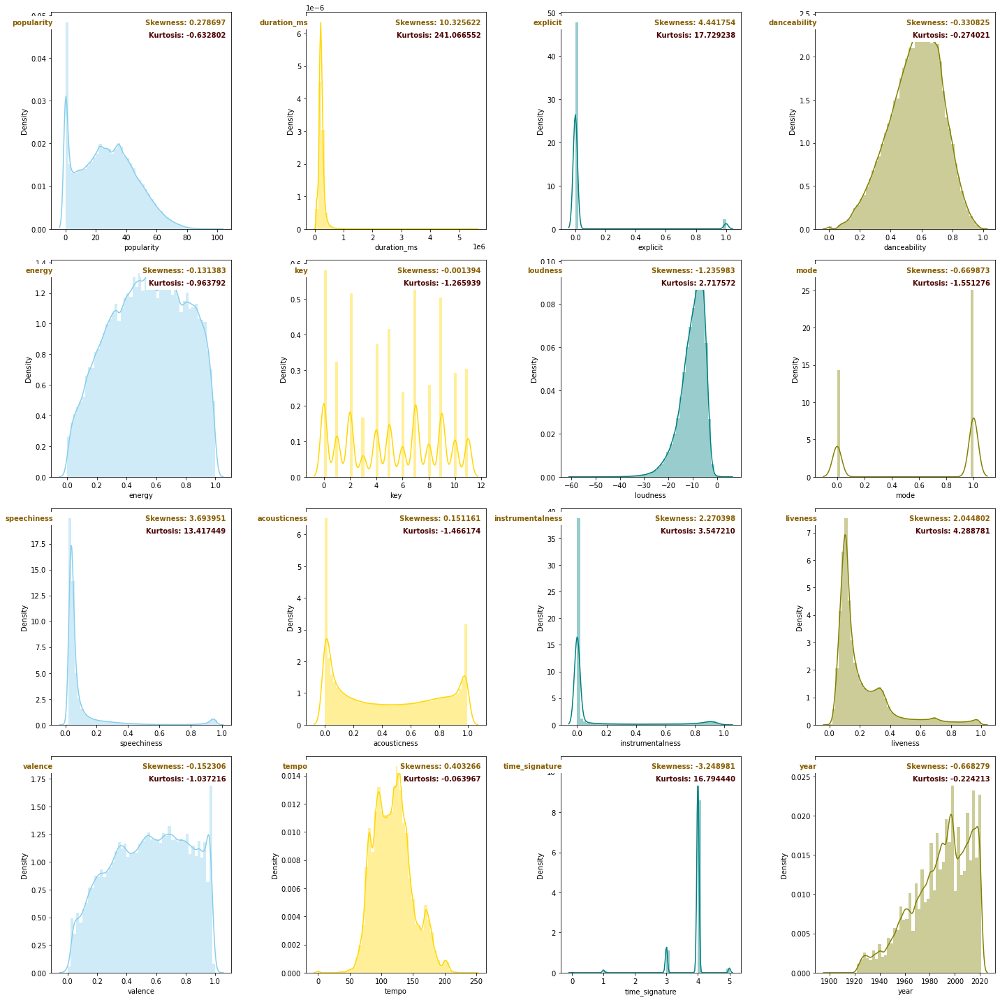

In [ ]:
colors = ["skyblue","gold","teal","olive"]
namesOfFeatures = df.columns

colorIdx = 0
f, axes = plt.subplots(4,4,figsize=(20, 20))
i = 0
j = 0
take = 0
for feature in namesOfFeatures:
    print(i," ", j)
    sns.distplot(df[feature], color=colors[colorIdx%4], ax=axes[i,j])
    if j >= 3: 
        i+=1
        j=0
    else: 
        j+=1
    colorIdx+=1
    
for i, ax in enumerate(axes.reshape(-1)):
    ax.text(x=0.97, y=0.97, transform=ax.transAxes, s="Skewness: %f" % df.iloc[:,i].skew(),\
        fontweight='demibold', fontsize=10, verticalalignment='top', horizontalalignment='right',\
        backgroundcolor='white', color='xkcd:poo brown')
    ax.text(x=0.97, y=0.91, transform=ax.transAxes, s="Kurtosis: %f" % df.iloc[:,i].kurt(),\
        fontweight='demibold', fontsize=10, verticalalignment='top', horizontalalignment='right',\
        backgroundcolor='white', color='xkcd:dried blood')
    ax.text(x=0.01, y=0.97, transform=ax.transAxes, s=namesOfFeatures[i],\
        fontweight='demibold', fontsize=10, verticalalignment='top', horizontalalignment='right',\
        backgroundcolor='white', color='xkcd:poo brown')
    
plt.tight_layout()

### 3.3 Visualize THe BoxPlot with each feature in Univariate and Multivariate analyses to help us detect the Outliers


#### 3.3.1 Uni-variate(one variable outlier analysis) Outliers:

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

popularity             28.00000
duration_ms         88774.00000
explicit                0.00000
danceability            0.23300
energy                  0.40500
key                     6.00000
loudness                6.40900
mode                    1.00000
speechiness             0.04230
acousticness            0.68810
instrumentalness        0.00955
liveness                0.17970
valence                 0.42300
tempo                  40.72100
time_signature          0.00000
dtype: float64


<AxesSubplot:xlabel='popularity'>

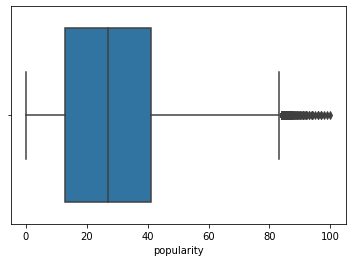

In [ ]:
#Visualize the Outliers using BoxPlots
sns.boxplot(x=df['popularity'])

<AxesSubplot:xlabel='duration_ms'>

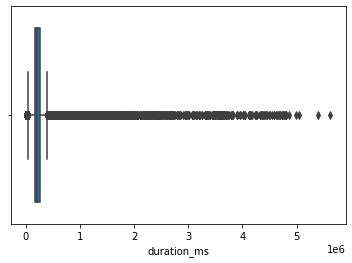

In [ ]:
sns.boxplot(x=df['duration_ms'])

<AxesSubplot:xlabel='explicit'>

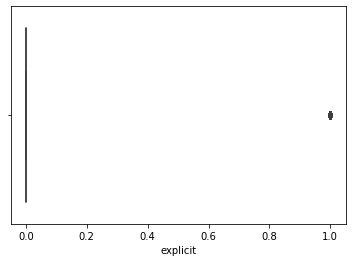

In [ ]:
sns.boxplot(x=df['explicit'])

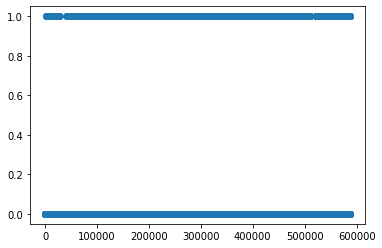

In [ ]:
plt.scatter(range(len(df['explicit'])), df['explicit'])

<AxesSubplot:xlabel='danceability'>

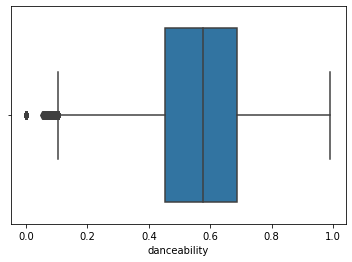

In [ ]:
sns.boxplot(x=df['danceability'])

<AxesSubplot:xlabel='energy'>

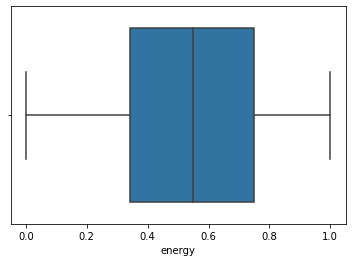

In [ ]:
sns.boxplot(x=df['energy'])

<AxesSubplot:xlabel='key'>

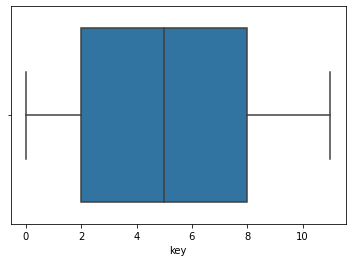

In [ ]:
sns.boxplot(x=df['key'])

<AxesSubplot:xlabel='loudness'>

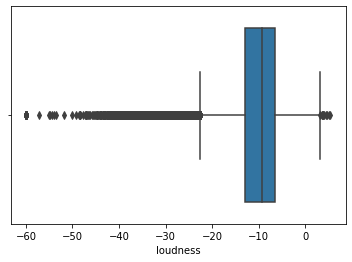

In [ ]:
sns.boxplot(x=df['loudness'])

<AxesSubplot:xlabel='mode'>

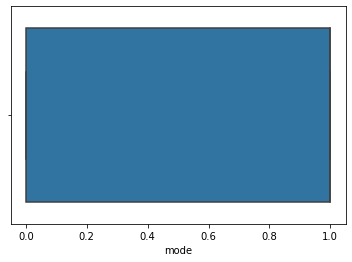

In [ ]:
sns.boxplot(x=df['mode'])

In [ ]:
features = df.columns
features

Index(['popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'year'],
      dtype='object')

<AxesSubplot:xlabel='speechiness'>

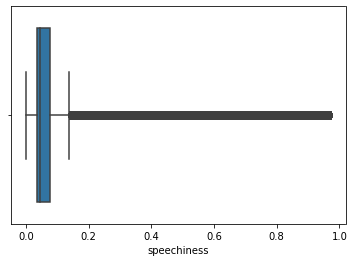

In [ ]:
sns.boxplot(x=df['speechiness'])

<AxesSubplot:xlabel='acousticness'>

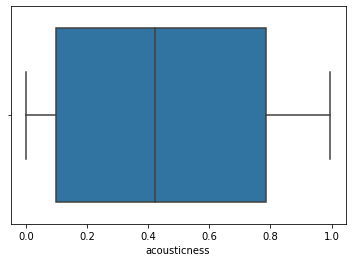

In [ ]:
sns.boxplot(x=df['acousticness'])

<AxesSubplot:xlabel='instrumentalness'>

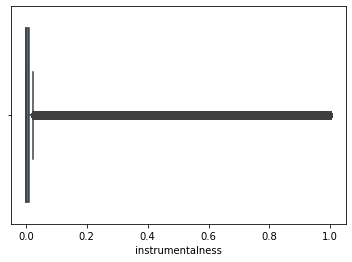

In [ ]:
sns.boxplot(x=df['instrumentalness'])

(array([484334.,  12730.,   8441.,   6642.,   6190.,   6302.,   7276.,
         10380.,  23553.,  20824.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

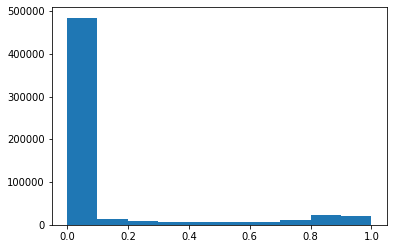

In [ ]:
plt.hist(df['instrumentalness'])

<AxesSubplot:xlabel='liveness'>

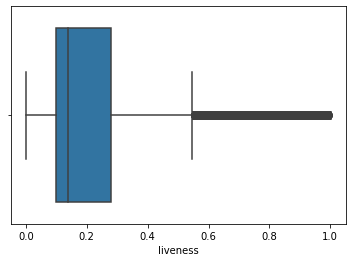

In [ ]:
sns.boxplot(x=df['liveness'])

<AxesSubplot:xlabel='valence'>

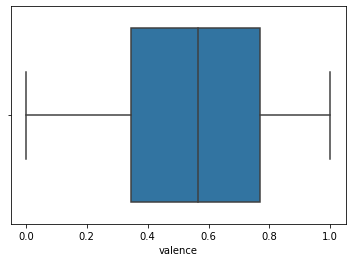

In [ ]:
sns.boxplot(x=df['valence'])

<AxesSubplot:xlabel='tempo'>

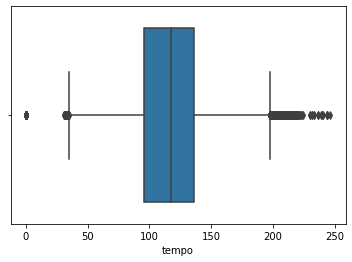

In [ ]:
sns.boxplot(x=df['tempo'])

<AxesSubplot:xlabel='time_signature'>

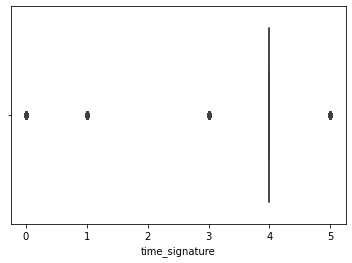

In [ ]:
sns.boxplot(x=df['time_signature'])

(array([3.37000e+02, 0.00000e+00, 6.60400e+03, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 6.45230e+04, 0.00000e+00, 5.03808e+05, 1.14000e+04]),
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. ]),
 <BarContainer object of 10 artists>)

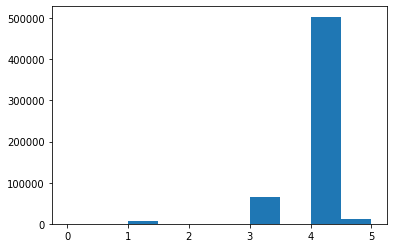

In [ ]:
plt.hist(df['time_signature'])

#### From the three sections above, we can clearly see that there is skewing in the data. In this sense, we need to take outliers into consideration. However, the problem is that we need to rely more on multi-variant outliers.

#### 3.3.2 Multi-variate(More Than one Variable outlier analysis) Outliers:

In [ ]:
df['duration_m'] = df['duration_ms'].apply(lambda x:round(x/(1000*60)))
df.drop('duration_ms',axis=1,inplace=True)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
durationScaled = scaler.fit_transform(np.array(df['duration_m']).reshape(-1,1))
df.drop('duration_m',axis=1,inplace=True)
df['duration_m'] = durationScaled

In [ ]:
df['duration_m'].max()

1.0

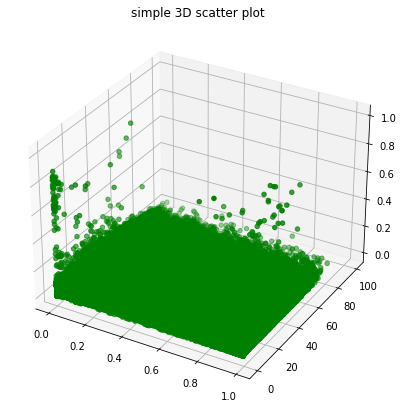

In [ ]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
# Creating plot
ax.scatter3D(df['acousticness'], df['popularity'], df['duration_m'], color = "green")
plt.title("simple 3D scatter plot")
 
# show plot
plt.show()

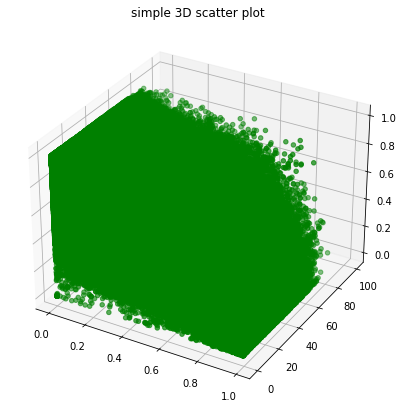

In [ ]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
# Creating plot
ax.scatter3D(df['acousticness'], df['popularity'], df['energy'], color = "green")
plt.title("simple 3D scatter plot")
 
# show plot
plt.show()

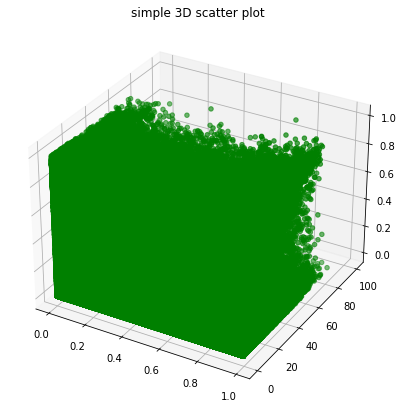

In [ ]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
# Creating plot
ax.scatter3D(df['acousticness'], df['popularity'], df['instrumentalness'], color = "green")
plt.title("simple 3D scatter plot")
 
# show plot
plt.show()

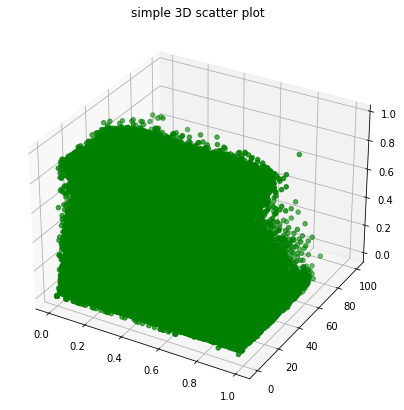

In [ ]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
# Creating plot
ax.scatter3D(df['liveness'], df['popularity'], df['speechiness'], color = "green")
plt.title("simple 3D scatter plot")
 
# show plot
plt.show()

### Conclusion: 
#### Generally, We cannot take into consideration the univriate outlier analysis in the features alone. We have a solution, which is using PCA. Another solution is to see the correlation between all the variables to see which one is better. I have tried to analyze the outliers from skewness, univariate, and multivariate plots, and reach a meaningful conclusion. After constructing some boxes and plots in higher dimensions to see the outliers, we can notice that there are some outliers in duration_m. 

### 3.4 Number of Tracks each year

In [ ]:
df_temp = df_by_track.copy()
df_temp.set_index('release_date',inplace=True)
df_temp.index = pd.to_datetime(df_temp.index)


In [ ]:
import plotly.express as px
fig = px.bar(df_temp["id"].groupby(pd.Grouper(freq="Y")).count(),labels={
                     "release_date": "Release Year",
                     "value": "Number of tracks"})
fig.update_layout(height=600, width=1200, title_text="Number of Tracks Over Years")

fig.show()

### Conclusion: 
#### We can See that the number of tracks increase but not linearly. Also, there are some drops in specific years. Intutively, we can see that the number of tracks has been increased dramatically overtime

### 3.5 Liveness vs Time

In [ ]:
fig = px.bar(df_temp["liveness"].groupby(pd.Grouper(freq="Y")).mean(),labels={
                     "release_date": "Release Year",
                     "value": "Liveness (%)"})
fig.update_layout(height=600, width=1200, title_text="Audience Voice Liveness Over Years")

fig.show()

### Conclusion: 
#### We can see from the bar chart above that it is slowely decreasing. It means that the liveness rate is decreasing overtime

### 3.6 Track Duration  vs Time

In [ ]:
fig = px.bar(df_temp["duration_ms"].groupby(pd.Grouper(freq="Y")).mean(),labels={
                     "release_date": "Release Year",
                     "value": "Track Duration (ms)"})
fig.update_layout(height=600, width=1200, title_text="Track Duration Over Years")

fig.show()

### Conclusion: 
#### We can see from the bar chart above that it is slowely decreasing. It means that the liveness rate is decreasing overtime

### 3.7 Valence vs Time

In [ ]:
fig = px.bar(df_temp["valence"].groupby(pd.Grouper(freq="Y")).mean(),labels={
                     "release_date": "Release Year",
                     "value": "valence (minutes)"})
fig.update_layout(height=600, width=1200, title_text="valence Over Years")

fig.show()

### It is very difficult to cliam that the sad songs have been released much more than happy songs, but by time passing, we can notice that the valence is somhow decreasing slowly.

### 3.8 BiVariate Data Analysis 
![1_bB56fmAsXp9FKcfCsv9P1g.png](attachment:1_bB56fmAsXp9FKcfCsv9P1g.png)


#### 3.8.1 Using Heatmaps Representing Correlations

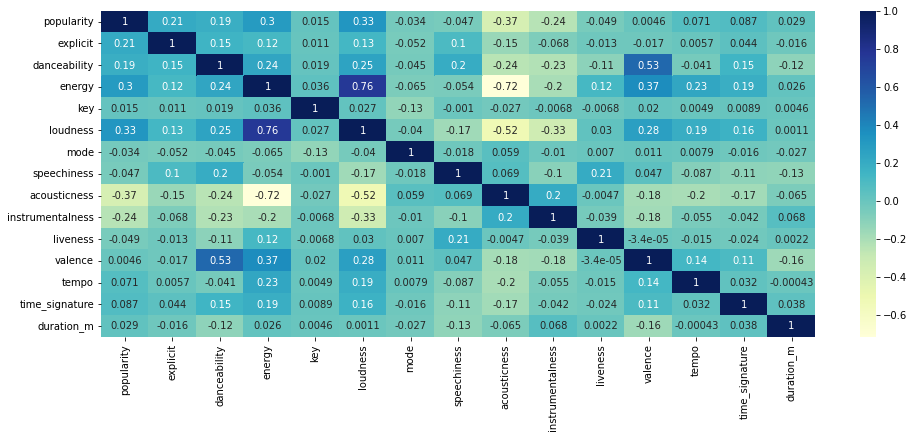

In [ ]:
plt.figure(figsize=(16, 6))

dataplot = sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)
plt.show()

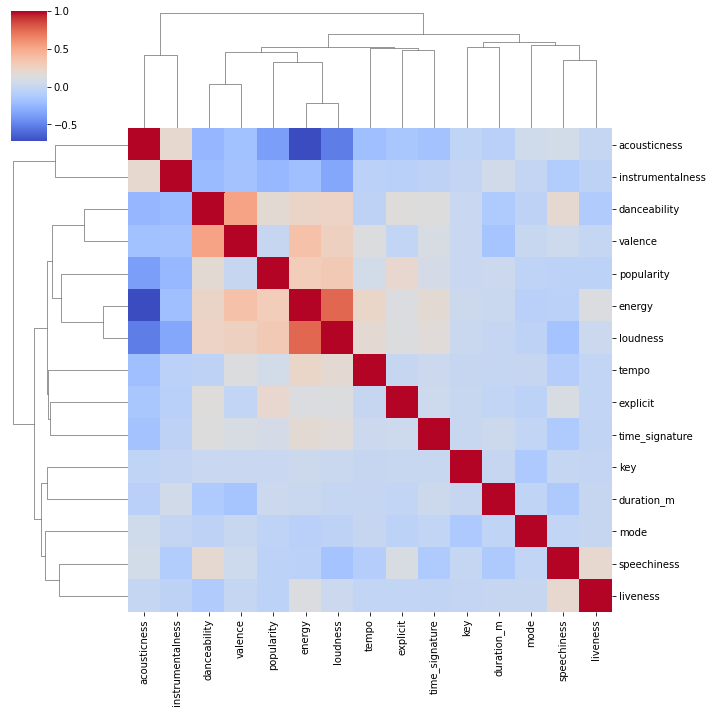

In [ ]:
sns.clustermap(df.corr(),cmap="coolwarm")

#### 3.8.2 Checking the correlations between continous features

<Figure size 1152x576 with 0 Axes>

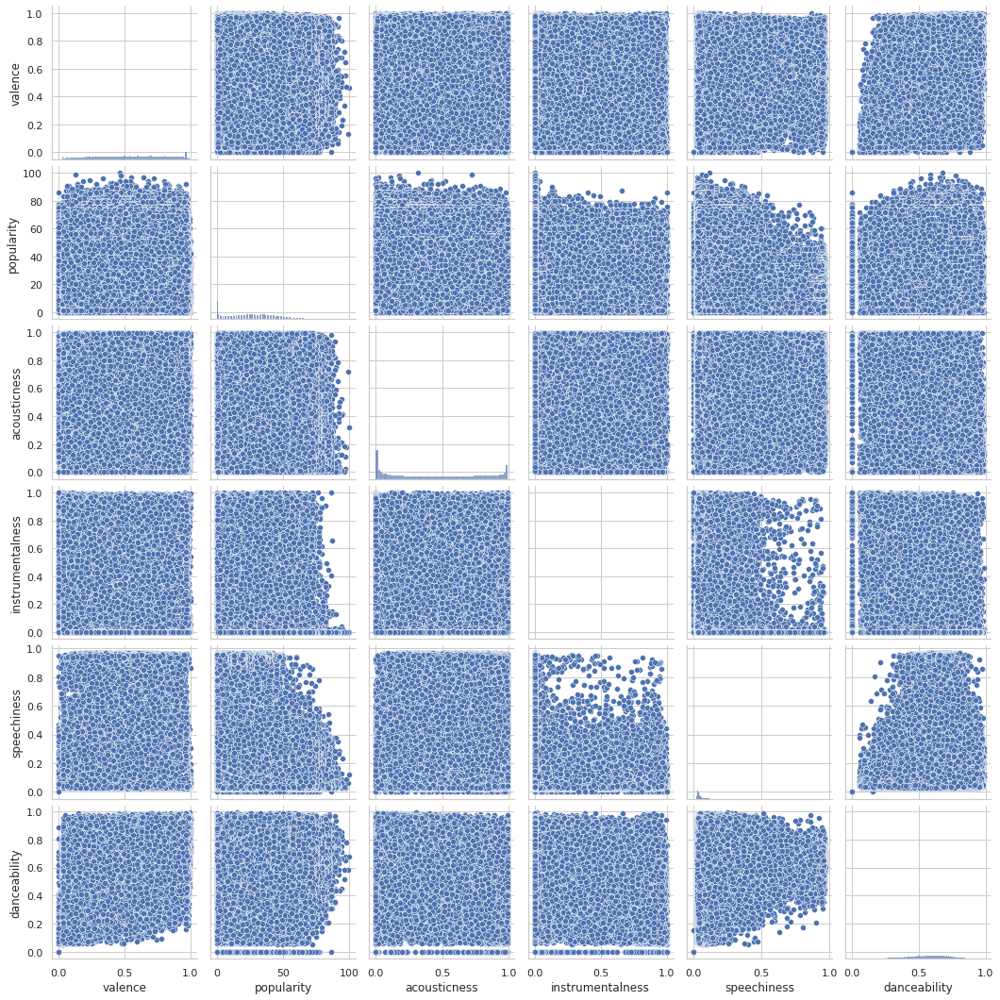

In [ ]:
# Popularity of Genres with respect to the various features
plt.figure(figsize=(16, 8))
sns.set(style="whitegrid")
cols = ["valence","popularity","acousticness","instrumentalness","speechiness","danceability" ]
sns.pairplot(df[cols], height = 2.5 )
plt.show();

In [ ]:
import plotly.express as px #Interactive Plots
import statsmodels.api as sm

main_df = df.copy()
def plot_corr(feature_1,feature_2,title):
    corr_df = main_df[[feature_1,feature_2]]
    corr_df["feature_1_interval"] = pd.cut(main_df[feature_1],np.arange(0,1,0.0001),labels=[f"{feature_1}_{i}" for i in range(1,10000)])
    corr_df = corr_df.groupby("feature_1_interval").median()
    plot = px.scatter(corr_df,x=feature_1, y=feature_2,trendline="ols",trendline_color_override="red")
    plot.update_traces(marker=dict(size=5,color='rgba(30, 215, 96, .9)',
                                  line=dict(width=1)),
                      selector=dict(mode='markers'))
    plot.update_layout(title_text=title)

    plot.show()


### 3.8.3 Popularity vs Danceability

In [ ]:
plot_corr("danceability", "popularity","danceability vs popularity")

/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Conclusion: 
#### It is obvious to see that when the type of the song is somehow danceable, the popularity of the song is quite high. Although there are some outliers at the beginning undermine the claim, but, overall, there is a strong relationship between them.

In [ ]:
#### 6. Is there a directed relationship between danceability, Energy, and instrumentalness?


In [ ]:
plot_corr("danceability","energy","Energy vs danceability")

/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("instrumentalness","energy","Energy vs instrumentalness")

/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("danceability","instrumentalness","instrumentalness vs danceability")

/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### From the 3 graphs above, there is a strong correlation between danceability and energy. Also, there is a correlation between energy and insturmentlness. However, there is no relationship between danceability and insturmentlness.

In [ ]:
plot_corr("acousticness","instrumentalness","instrumentalness vs Acousticness")

/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("danceability","speechiness","danceability vs speechiness")

/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("danceability","acousticness","danceability vs Acousticness")

/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("instrumentalness","popularity","instrumentalness vs popularity")


/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("valence","energy","energy vs valence")


/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("energy","tempo","energy vs tempo")


/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
plot_corr("energy","popularity","energy vs popularity")


/home/ayman/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### We can notice that there are correlations between features, but popularity is the more connected to the other features. Connection means that there is a strong correlation.

In [ ]:
df

,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,year,duration_m
0,6,0,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3,1922,0.021277
1,0,0,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1,1922,0.021277
2,0,0,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5,1922,0.031915
3,0,0,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3,1922,0.031915
4,0,0,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4,1922,0.031915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,50,0,0.560,0.5180,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4,2020,0.042553
586668,72,0,0.765,0.6630,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4,2020,0.031915
586669,70,0,0.535,0.3140,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4,2020,0.031915
586670,58,0,0.696,0.6150,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4,2021,0.021277


In [ ]:
Y = pd.qcut(df['popularity'], 3)

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(Y)

LabelEncoder()

In [ ]:
Y = le.transform(Y)

In [ ]:
df['popularity'] = Y # LOw, Medium, High

In [ ]:
data = (df
        .groupby(['popularity', 'mode'])['mode']
        .count()
        .unstack(1))

data.style.background_gradient(cmap=plt.cm.coolwarm_r)

mode,0,1
popularity,,
0,64927,134639
1,67293,131212
2,67954,120647


In [ ]:
data = (df
        .groupby(['popularity', 'key'])['key']
        .count()
        .unstack(1))

data.style.background_gradient(cmap=plt.cm.coolwarm_r)

key,0,1,2,3,4,5,6,7,8,9,10,11
popularity,,,,,,,,,,,,
0,26118,12855,22369,9617,15419,20846,9121,25450,12099,20343,14114,11215
1,26111,12983,24225,6070,17089,17368,9840,25768,10029,23934,11750,13338
2,22721,15898,19958,5848,15712,15400,11895,22561,11332,20851,11846,14579


In [ ]:
data = (df
        .groupby(['popularity', 'time_signature'])['time_signature']
        .count()
        .unstack(1))

data.style.background_gradient(cmap=plt.cm.coolwarm_r)

time_signature,0,1,3,4,5
popularity,,,,,
0,137,3150,29735,161340,5204
1,59,2347,21821,170350,3928
2,141,1107,12967,172118,2268


#### Checking if two categorical variables are independent can be done with Chi-Squared test of independence.
#### Chi-Square test of independence is most commonly used to test association between two categorical variables. The output gives us p-value, degrees of freedom and expected values.

#### The Steps for using Chi-Square Test:Setting Hypothesis, Prepare Contingency Table, Getting Expected Value Count, Comparing Observed Value with Expected Value and concluding the Hypothesis


In [ ]:
###https://medium.com/@ritesh.110587/correlation-between-categorical-variables-63f6bd9bf2f7
# import scipy.stats as ss
# def cramers_v(x, y):
#     confusion_matrix = pd.crosstab(x,y)
#     chi2 = ss.chi2_contingency(confusion_matrix)[0]
#     n = confusion_matrix.sum().sum()
#     phi2 = chi2/n
#     r,k = confusion_matrix.shape
#     phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
#     rcorr = r-((r-1)**2)/(n-1)
#     kcorr = k-((k-1)**2)/(n-1)
#     return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))
# cramers_v(df['genre'],df['mode'])

In [ ]:
categorical_col = ['mode','key']
chisqt = pd.crosstab(df['popularity'], df['key'], margins=True)
print(chisqt)


key             0      1      2      3      4      5      6      7      8  \
popularity                                                                  
0           26118  12855  22369   9617  15419  20846   9121  25450  12099   
1           26111  12983  24225   6070  17089  17368   9840  25768  10029   
2           22721  15898  19958   5848  15712  15400  11895  22561  11332   
All         74950  41736  66552  21535  48220  53614  30856  73779  33460   

key             9     10     11     All  
popularity                               
0           20343  14114  11215  199566  
1           23934  11750  13338  198505  
2           20851  11846  14579  188601  
All         65128  37710  39132  586672  


In [ ]:
from scipy.stats import chi2_contingency 
print('                          ','pValue ', 'Statistical Value ', 'The Degree of Freedom')

chisqt = pd.crosstab(df['key'], df['mode'], margins=True)
value = np.array([chisqt.iloc[0][0:5].values,
                      chisqt.iloc[1][0:5].values])
print("The Feature ",'mode Vs Key' , ":",chi2_contingency(value)[0:3])
chisqt = pd.crosstab(df['popularity'], df['mode'], margins=True)
value = np.array([chisqt.iloc[0][0:5].values,
                      chisqt.iloc[1][0:5].values])
print("The Feature ",'mode Vs popularity' , ":",chi2_contingency(value)[0:3])
chisqt = pd.crosstab(df['popularity'], df['key'], margins=True)
value = np.array([chisqt.iloc[0][0:5].values,
                      chisqt.iloc[1][0:5].values])
print("The Feature ",'key Vs popularity' , ":",chi2_contingency(value)[0:3])

                           pValue  Statistical Value  The Degree of Freedom
The Feature  mode Vs Key : (1042.089004803864, 5.167110876800684e-227, 2)
The Feature  mode Vs popularity : (83.68720638614386, 6.722859425745086e-19, 2)
The Feature  key Vs popularity : (962.3145762369305, 5.238821225276307e-207, 4)


### We know that if Pvalue >0.05, the two features are independent. (Accepting Null Hypothesis)

### Popularity vs artist Name

/home/ayman/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, "['Die drei ???']"),
  Text(1, 0, "['TKKG Retro-Archiv']"),
  Text(2, 0, "['Bibi Blocksberg']"),
  Text(3, 0, "['Benjamin Blümchen']"),
  Text(4, 0, "['Bibi und Tina']"),
  Text(5, 0, "['Queen']"),
  Text(6, 0, "['Fünf Freunde']"),
  Text(7, 0, "['Taylor Swift']"),
  Text(8, 0, "['Elvis Presley']"),
  Text(9, 0, "['Pink Floyd']")])

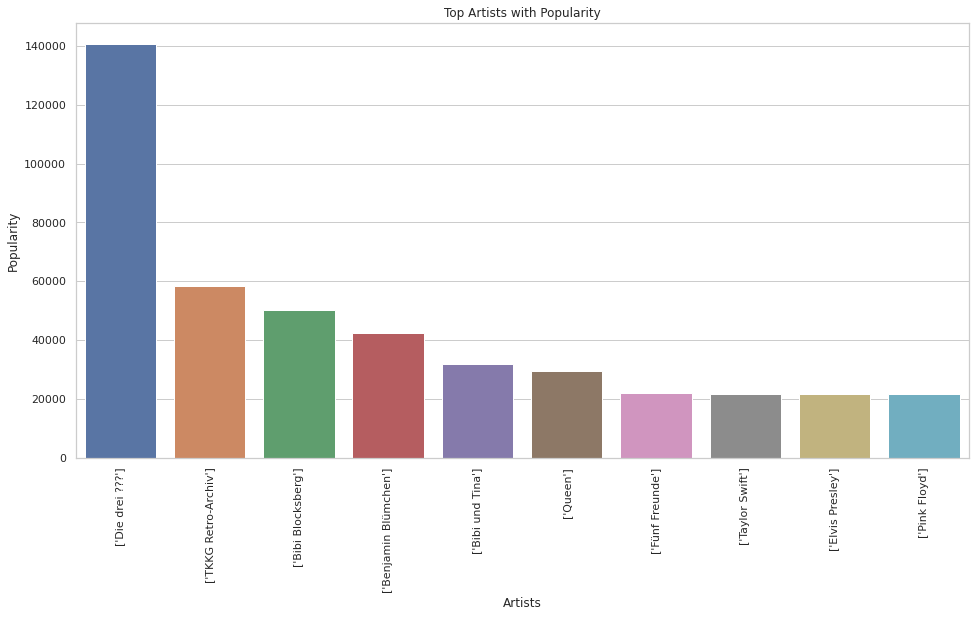

In [ ]:
plt.figure(figsize=(16, 8))
sns.set(style="whitegrid")
x = df_by_track.groupby("artists")["popularity"].sum().sort_values(ascending=False).head(10)
ax = sns.barplot(x.index, x)
ax.set_title('Top Artists with Popularity')
ax.set_ylabel('Popularity')
ax.set_xlabel('Artists')
plt.xticks(rotation = 90)

# 4. Data Wrangling and Feature Engineering

In [ ]:
df = df_t.copy()

In [ ]:
df_t = df.copy()
df_t.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   popularity        586672 non-null  int64  
 1   explicit          586672 non-null  int64  
 2   danceability      586672 non-null  float64
 3   energy            586672 non-null  float64
 4   key               586672 non-null  int64  
 5   loudness          586672 non-null  float64
 6   mode              586672 non-null  int64  
 7   speechiness       586672 non-null  float64
 8   acousticness      586672 non-null  float64
 9   instrumentalness  586672 non-null  float64
 10  liveness          586672 non-null  float64
 11  valence           586672 non-null  float64
 12  tempo             586672 non-null  float64
 13  time_signature    586672 non-null  int64  
 14  year              586672 non-null  object 
 15  duration_m        586672 non-null  float64
dtypes: float64(10), int6

#### I dropped unnecessary features during visualization. 

### 4.1 Handling the problem of Outliers
#### Outliers lead to many problems "sensitivity to the noise". Now, we can solve the problem using different techniques. If we delete all outliers, the majority of the data will be deleted. If we leave the outliers, problems will occur. Also, we saw from multi-variate analysis, most of the outliers occur with duration time
#### Through research, I have found that the features whose interval between [0,1] have come from APIs, so it does not mean that they are outliers. However, duration_ms is pointy (according to kurtosis), so we will remove the outliers with duration_ms only

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

popularity           2.000000
explicit             0.000000
danceability         0.233000
energy               0.405000
key                  6.000000
loudness             6.409000
mode                 1.000000
speechiness          0.042300
acousticness         0.688100
instrumentalness     0.009550
liveness             0.179700
valence              0.423000
tempo               40.721000
time_signature       0.000000
duration_m           0.010638
dtype: float64


In [ ]:
df['duration_m'] = df['duration_m'][~((df['duration_m'] < (Q1['duration_m'] - 1.5 * IQR['duration_m'])) |(df['duration_m'] > (Q3['duration_m'] + 1.5 * IQR['duration_m'])))]


In [ ]:
df = df.dropna(axis = 0)

In [ ]:
df.isnull().sum()

popularity          0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
year                0
duration_m          0
dtype: int64

In [ ]:
df.shape

(508698, 16)

In [ ]:
df

,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,year,duration_m
0,0,0,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3,1922,0.021277
1,0,0,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1,1922,0.021277
2,0,0,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5,1922,0.031915
3,0,0,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3,1922,0.031915
4,0,0,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4,1922,0.031915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,2,0,0.560,0.5180,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4,2020,0.042553
586668,2,0,0.765,0.6630,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4,2020,0.031915
586669,2,0,0.535,0.3140,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4,2020,0.031915
586670,2,0,0.696,0.6150,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4,2021,0.021277


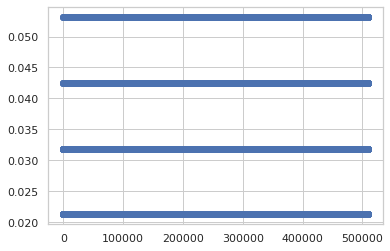

In [ ]:
plt.scatter(range(len(df['duration_m'])), df['duration_m'])

### 4.2 Converting all categorical features to one hot encoding

In [ ]:
key_one_hot_encoding= pd.get_dummies(df_by_track['key']) #One Hot Encoding to the Key
mode_one_hot_encoding= pd.get_dummies(df_by_track['mode']) #One Hot Encoding to the Mode
time_one_hot_encoding= pd.get_dummies(df_by_track['time_signature']) 
explicit_one_hot_encoding= pd.get_dummies(df_by_track['explicit']) 

In [ ]:
df.drop('mode', inplace=True, axis=1)
df.drop('time_signature', inplace=True, axis=1)
df.drop('explicit', inplace=True, axis=1)

In [ ]:
df.drop('key', inplace=True, axis=1)


In [ ]:
df = pd.concat([df,key_one_hot_encoding,mode_one_hot_encoding,time_one_hot_encoding,explicit_one_hot_encoding],axis = 1)
df.head()

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,...,11,0,1,0,1,3,4,5,0,1
0,0.0,0.645,0.4450,-13.338,0.4510,0.674,0.7440,0.151,0.127,104.851,...,0,0,1,0,0,1,0,0,1,0
1,0.0,0.695,0.2630,-22.136,0.9570,0.797,0.0000,0.148,0.655,102.009,...,0,0,1,0,1,0,0,0,1,0
2,0.0,0.434,0.1770,-21.180,0.0512,0.994,0.0218,0.212,0.457,130.418,...,0,0,1,0,0,0,0,1,1,0
3,0.0,0.321,0.0946,-27.961,0.0504,0.995,0.9180,0.104,0.397,169.980,...,0,0,1,0,0,1,0,0,1,0
4,0.0,0.402,0.1580,-16.900,0.0390,0.989,0.1300,0.311,0.196,103.220,...,0,1,0,0,0,0,1,0,1,0


In [ ]:
df = df.dropna(axis = 0)

In [ ]:
df.isnull().sum()

popularity          0
danceability        0
energy              0
loudness            0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
year                0
duration_m          0
0                   0
1                   0
2                   0
3                   0
4                   0
5                   0
6                   0
7                   0
8                   0
9                   0
10                  0
11                  0
0                   0
1                   0
0                   0
1                   0
3                   0
4                   0
5                   0
0                   0
1                   0
dtype: int64

### 4.3 Seperate the label (ground Truth from the features and give to each label a unique id)

In [ ]:
Y = df['popularity'].copy()
# df.drop('ground_truth', inplace=True, axis=1)
# Y_label = labelencoder.fit_transform(Y)
df.shape

(508698, 33)

In [ ]:
Y

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
586667    2.0
586668    2.0
586669    2.0
586670    2.0
586671    2.0
Name: popularity, Length: 508698, dtype: float64

### 4.5 Handling negative Numbers 

In [ ]:
# Loudness -52.45700	
mnValue = df['loudness'].min()
mnValue 

-60.0

In [ ]:
alpha = -1*mnValue + 1

In [ ]:
loudnessFeature = np.log(df['loudness']+alpha)

In [ ]:
df.head()

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo,year,duration_m,...,0,1,0,1,3,4,5,0,1,loudness
0,0.645,0.4450,0.4510,0.674,0.7440,0.151,0.127,104.851,1922,0.021277,...,0,1,0,0,1,0,0,1,0,3.864134
1,0.695,0.2630,0.9570,0.797,0.0000,0.148,0.655,102.009,1922,0.021277,...,0,1,0,1,0,0,0,1,0,3.660068
2,0.434,0.1770,0.0512,0.994,0.0218,0.212,0.457,130.418,1922,0.031915,...,0,1,0,0,0,0,1,1,0,3.684369
3,0.321,0.0946,0.0504,0.995,0.9180,0.104,0.397,169.980,1922,0.031915,...,0,1,0,0,1,0,0,1,0,3.497689
4,0.402,0.1580,0.0390,0.989,0.1300,0.311,0.196,103.220,1922,0.031915,...,1,0,0,0,0,1,0,1,0,3.786460


In [ ]:
df.drop('loudness', inplace=True, axis=1)
df['loudness'] = loudnessFeature

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,508698.0,1.001964,0.817759,0.000000,0.000000,1.000000,2.000000,2.000000
danceability,508698.0,0.569769,0.162286,0.000000,0.463000,0.582000,0.688000,0.988000
energy,508698.0,0.549103,0.248799,0.000000,0.355000,0.558000,0.753000,1.000000
speechiness,508698.0,0.090292,0.146474,0.000000,0.033500,0.043400,0.072700,0.971000
acousticness,508698.0,0.443398,0.346250,0.000000,0.096500,0.408000,0.774000,0.996000
instrumentalness,508698.0,0.096219,0.247165,0.000000,0.000000,0.000017,0.004620,1.000000
liveness,508698.0,0.206051,0.174817,0.000000,0.097700,0.136000,0.266000,1.000000
valence,508698.0,0.565238,0.254212,0.000000,0.361000,0.579000,0.780000,1.000000
tempo,508698.0,119.163967,29.698424,0.000000,96.055000,117.959000,137.160750,246.381000
duration_m,508698.0,0.037715,0.009474,0.021277,0.031915,0.042553,0.042553,0.053191


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
tempoScaled = scaler.fit_transform(np.array(df['tempo']).reshape(-1,1))
tempoScaled

array([[0.42556447],
       [0.41402949],
       [0.52933465],
       ...,
       [0.58890499],
       [0.36540561],
       [0.45540849]])

In [ ]:
df['tempo'] = tempoScaled

In [ ]:
df

,popularity,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo,year,...,0,1,0,1,3,4,5,0,1,loudness
0,0.0,0.645,0.4450,0.4510,0.674,0.744000,0.1510,0.1270,0.425564,1922,...,0,1,0,0,1,0,0,1,0,3.864134
1,0.0,0.695,0.2630,0.9570,0.797,0.000000,0.1480,0.6550,0.414029,1922,...,0,1,0,1,0,0,0,1,0,3.660068
2,0.0,0.434,0.1770,0.0512,0.994,0.021800,0.2120,0.4570,0.529335,1922,...,0,1,0,0,0,0,1,1,0,3.684369
3,0.0,0.321,0.0946,0.0504,0.995,0.918000,0.1040,0.3970,0.689907,1922,...,0,1,0,0,1,0,0,1,0,3.497689
4,0.0,0.402,0.1580,0.0390,0.989,0.130000,0.3110,0.1960,0.418945,1922,...,1,0,0,0,0,1,0,1,0,3.786460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,2.0,0.560,0.5180,0.0292,0.785,0.000000,0.0648,0.2110,0.535333,2020,...,1,0,0,0,0,1,0,1,0,3.980224
586668,2.0,0.765,0.6630,0.0652,0.141,0.000297,0.0924,0.6860,0.609183,2020,...,0,1,0,0,0,1,0,1,0,4.021362
586669,2.0,0.535,0.3140,0.0408,0.895,0.000150,0.0874,0.0663,0.588905,2020,...,1,0,0,0,0,1,0,1,0,3.874882
586670,2.0,0.696,0.6150,0.0345,0.206,0.000003,0.3050,0.4380,0.365406,2021,...,0,1,0,0,0,1,0,1,0,4.003471


In [ ]:
X = df.copy() 

In [ ]:
namesOfFeatures = df.columns

    
for feature in namesOfFeatures:
    print("Feature: ", feature)
    print(" Skew: ", df[feature].skew())
    print( " Kurtosis: ", df[feature].kurt())


Feature:  popularity
 Skew:  -0.0036133649489277636
 Kurtosis:  -1.5046199096364568
Feature:  danceability
 Skew:  -0.318947917239717
 Kurtosis:  -0.24800769469972916
Feature:  energy
 Skew:  -0.1539050390362719
 Kurtosis:  -0.9504159517985769
Feature:  speechiness
 Skew:  4.399294469055858
 Kurtosis:  20.953137779760198
Feature:  acousticness
 Skew:  0.1847074777804972
 Kurtosis:  -1.4443565172345163
Feature:  instrumentalness
 Skew:  2.5695706289197826
 Kurtosis:  5.075507875716347
Feature:  liveness
 Skew:  2.1509808329533575
 Kurtosis:  5.050233607198839
Feature:  valence
 Skew:  -0.1807788514387584
 Kurtosis:  -1.0257930040207344
Feature:  tempo
 Skew:  0.4370681364151464
 Kurtosis:  -0.12704369613271238
Feature:  year
 Skew:  -0.7101914245486478
 Kurtosis:  -0.17584152169011702
Feature:  duration_m
 Skew:  0.029151547961692593
 Kurtosis:  -0.7553318762837189
Feature:  0
 Skew:  0     2.225644
0     0.686083
0    56.895818
0    -4.244954
dtype: float64
 Kurtosis:  0       2.953505

### We can see from above, after rescaling, skew and kurtosis approaches to the symmetric state.

## 4. Data Modeling (Clustering)
#### There are a number of clustering methods, as Affanity propgation, Expectation Maximization, Kmeans, and Hirechical Clustering. Affinity propgation and Expecation maximization needs huge memory to be able to store the data. More clearly, we know that affinity propgation creates three 2D matrix to calculate the exemplers with calculating responsability, availability, and self-availbility. Also, we know that K-means clustering is a special case of EM. EM is using distributions (mean and variance) to form clusters (Soft Clustering). Generally, I will be using K-means for visualizing the data, as it is the simplist one in terms of complexity

### 4.1 K-means Clustering (Hard Clustering) I will use Elbow Analysis to get the best number of clusters
#### We can see below that according to Distortion, it is better to choose the number of clusters between 10 to 15, while inertia method proves that 5 is the best. Due to huge data points, we will not be able to distinguish between them clearly. We use the Cluster when the following equation ![image.png](attachment:image.png)  is minmized abruptly

In [ ]:

from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 30)
 
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(X)
    kmeanModel.fit(X)
 
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / X.shape[0])
    inertias.append(kmeanModel.inertia_)
 
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / X.shape[0]

### 4.1.2 Using Distortion 

In [ ]:
for key, val in mapping1.items():
    print(f'{key} : {val}')

1 : 18.977997293067556
2 : 10.840333171733626
3 : 7.676971933193544
4 : 5.901050849952667
5 : 4.824753905244216
6 : 4.144003636055422
7 : 3.6144866851779716
8 : 3.268732275545202
9 : 3.034082278482997
10 : 2.812249044023169
11 : 2.654351845279177
12 : 2.541166568207268
13 : 2.430082792943792
14 : 2.341292581896053
15 : 2.2323894067572723
16 : 2.1642781519696017
17 : 2.1188540619607457
18 : 2.0486308777013207
19 : 2.0192543053108767
20 : 1.979323095476908
21 : 1.9497397606274203
22 : 1.9241712548454812
23 : 1.8839847706483575
24 : 1.8603878719532319
25 : 1.8359288478704945
26 : 1.8174245184675264
27 : 1.8072168309027925
28 : 1.7859845304972346
29 : 1.77066830680304


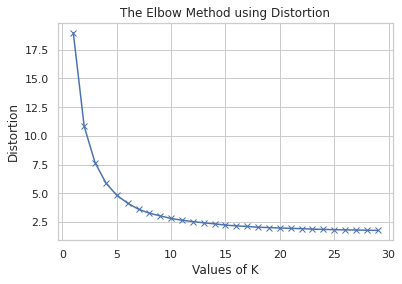

In [ ]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

### 4.1.2 Using Inertia

In [ ]:
for key, val in mapping2.items():
    print(f'{key} : {val}')

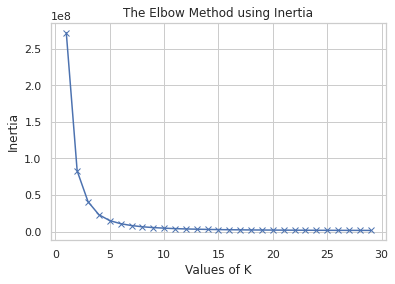

In [ ]:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

In [ ]:
X = np.array(X)

#### Just to draw the clustering for visualization. I will take a subset from the data

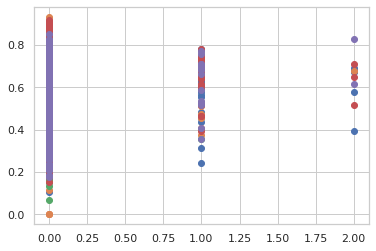

In [ ]:
def kmeansClustering(n_clusters, X):
    model = KMeans(n_clusters=n_clusters)
    # fit the model
    model.fit(X)
    # assign a cluster to each example
    yhat = model.predict(X)
    # retrieve unique clusters
    clusters = np.unique(yhat)
    # create scatter plot for samples from each cluster
    for cluster in clusters:
        # get row indexes for samples with this cluster
        row_ix = np.where(yhat == cluster)
        # create scatter of these samples
        plt.scatter(X[row_ix, 0], X[row_ix, 1])
    # show the plot
    plt.show()
kmeansClustering(5,X[:5000,])

# 5. Training the Model with Pre-processed DataSet

In [ ]:
 Y_label = Y

In [ ]:
df

,popularity,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo,year,...,0,1,0,1,3,4,5,0,1,loudness
0,0.0,0.645,0.4450,0.4510,0.674,0.744000,0.1510,0.1270,0.425564,1922,...,0,1,0,0,1,0,0,1,0,3.864134
1,0.0,0.695,0.2630,0.9570,0.797,0.000000,0.1480,0.6550,0.414029,1922,...,0,1,0,1,0,0,0,1,0,3.660068
2,0.0,0.434,0.1770,0.0512,0.994,0.021800,0.2120,0.4570,0.529335,1922,...,0,1,0,0,0,0,1,1,0,3.684369
3,0.0,0.321,0.0946,0.0504,0.995,0.918000,0.1040,0.3970,0.689907,1922,...,0,1,0,0,1,0,0,1,0,3.497689
4,0.0,0.402,0.1580,0.0390,0.989,0.130000,0.3110,0.1960,0.418945,1922,...,1,0,0,0,0,1,0,1,0,3.786460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,2.0,0.560,0.5180,0.0292,0.785,0.000000,0.0648,0.2110,0.535333,2020,...,1,0,0,0,0,1,0,1,0,3.980224
586668,2.0,0.765,0.6630,0.0652,0.141,0.000297,0.0924,0.6860,0.609183,2020,...,0,1,0,0,0,1,0,1,0,4.021362
586669,2.0,0.535,0.3140,0.0408,0.895,0.000150,0.0874,0.0663,0.588905,2020,...,1,0,0,0,0,1,0,1,0,3.874882
586670,2.0,0.696,0.6150,0.0345,0.206,0.000003,0.3050,0.4380,0.365406,2021,...,0,1,0,0,0,1,0,1,0,4.003471


In [ ]:
#Split for Training, Validation and Testing 
from sklearn.model_selection import train_test_split


In [ ]:
 X_train, X_test, y_train, y_test = train_test_split(np.array(df),Y_label,test_size=0.2, random_state=42)

In [ ]:
 X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [ ]:
print(X_train.shape)
print(y_train.shape)

(325566, 33)
(325566,)


In [ ]:
print(X_test.shape)
print(y_test.shape)

(101740, 33)
(101740,)


In [ ]:
print(X_val.shape)
print(y_val.shape)

(81392, 33)
(81392,)


### Now the data is ready for training. Since we are only doing EDA, we do not need to train the data on a ML model. Generally, the problem is a classification problem (multiclass) [low, medium, High]. We can use neural network, logistic regression, SVM, Decision trees, and any other classifiers to solve the problem 

## Refrences: 
### https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
### https://realpython.com/k-means-clustering-python/
### https://www.geeksforgeeks.org/box-plot-in-python-using-matplotlib/
### https://www.kaggle.com/adisrw/spotify-data-analysis-using-python/data
### https://www.kaggle.com/ekami66/detailed-exploratory-data-analysis-with-python
### https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.chisquare.html
### https://towardsdatascience.com/statistics-in-python-using-chi-square-for-feature-selection-d44f467ca745
### https://medium.com/@outside2SDs/an-overview-of-correlation-measures-between-categorical-and-continuous-variables-4c7f85610365
### https://medium.com/@atanudan/kurtosis-skew-function-in-pandas-aa63d72e20de
### https://t.co/rurMFoBmlY